In [1]:
import numpy as np
import matplotlib.pyplot as plt
from confocalQuant.segmentation import extract_sbatch_parameters, show_meanproj_with_outlines, extract_channels, gamma_correct_image, get_czi_files, toggle_segmentation, float_to_int
from os import path


/home/gridsan/djuna/.local/lib/python3.8/site-packages/pydantic/_migration.py:281: UserWarning: `pydantic.error_wrappers:ValidationError` has been moved to `pydantic:ValidationError`.
  warnings.warn(f'`{import_path}` has been moved to `{new_location}`.')


In [2]:
params = extract_sbatch_parameters('./outs/neuronbatch10132023_cellrox_out/run_jobs_cellroxNeuN_1013.sbatch')
folder = params['--folder'][0][1:-1]
NZi = int(params['--NZi'][0])
xi_per_job = int(params['--xi_per_job'][0])
yi_per_job = int(params['--yi_per_job'][0])
cells_per_job = int(params['--cells_per_job'][0])
Ncells = int(params['--Ncells'][0])
Njobs = int(params['--Njobs'][0])
channels = [int(x) for x in params['--channels']]
mode = 'r'
zi_per_job = int(params['--zi_per_job'][0])

In [7]:
all_mat = np.lib.format.open_memmap(path.join(folder, 'mat.npy'), shape=(NZi, xi_per_job, yi_per_job, len(channels)), dtype=float, mode=mode)
all_masks = np.lib.format.open_memmap(path.join(folder, 'masks.npy'), shape=(NZi, xi_per_job, yi_per_job), dtype='uint16', mode=mode)
all_Y = np.lib.format.open_memmap(path.join(folder, 'Y_filtered.npy'), shape=(Ncells, len(channels)+2), dtype=float, mode=mode)
Ncells_per_job = np.lib.format.open_memmap(path.join(folder, 'Ncells_per_job.npy'), shape=(Njobs,1), dtype=int, mode=mode)
Nzi_per_job = np.lib.format.open_memmap(path.join(folder, 'Nzi_per_job.npy'), shape=(Njobs,1), dtype=int, mode=mode)

In [8]:
Ncells_per_job

memmap([[172],
        [ 96],
        [ 42],
        [ 54],
        [  0],
        [ 72],
        [ 73],
        [ 48],
        [ 51],
        [ 85],
        [ 59],
        [ 36],
        [ 61],
        [ 81],
        [108],
        [ 54],
        [ 77],
        [ 36],
        [ 50],
        [ 76]])

In [46]:
ID = 10
start = ID*zi_per_job
end = start + Nzi_per_job[ID][0]
mat_sele = all_mat[start:end]
mask_sele = all_masks[start:end]

out_med_gamma_sele = extract_channels([1,0], mat_sele)

toggle_segmentation(float_to_int(out_med_gamma_sele), mask_sele)


In [47]:
from skimage.segmentation import find_boundaries

def show_meanproj_with_outlines(mat2, masks):
    max_proj = np.max(mat2, axis=(0))

    for i in (range(masks.shape[0])):
        M = find_boundaries(masks[i], mode = 'outer', background = 0)
        max_proj[:,:,0][np.where(M)] = 255
        max_proj[:,:,1][np.where(M)] = 255
        max_proj[:,:,2][np.where(M)] = 255


    return max_proj

In [246]:
files[3]

'C03_2.czi'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


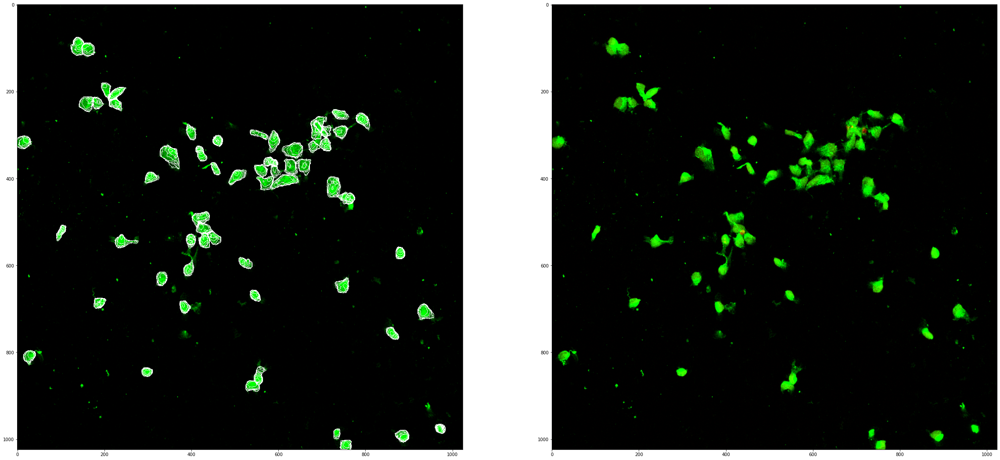

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(40, 40)) 


# remove masks for the second plot
masks_temp = mask_sele.copy()
masks_temp[masks_temp>0]=0

mat_sele1 = extract_channels([1], mat_sele)
mat_sele2 = extract_channels([1,0], mat_sele)

axs[0].imshow(show_meanproj_with_outlines(mat_sele1, mask_sele)) 
axs[1].imshow(show_meanproj_with_outlines(mat_sele2, masks_temp))

In [16]:
files = get_czi_files('./data/neuronbatch10132023_cellrox/////')

In [17]:
res = []
for ID in range(len(files)):
    start = ID*cells_per_job
    end = start + Ncells_per_job[ID][0]
    res.append(all_Y[start:end])

In [34]:
import pandas as pd
data = pd.DataFrame(np.vstack(res))
data.columns = ['DAPI', 'NeuN', 'TUJ', 'cellrox', 'cellrox-b', 'ID']
data['filename'] = [files[int(x)].split('.')[0] for x in data['ID']]
data['wellname'] = [files[int(x)].split('_')[0] for x in data['ID']]

In [35]:
data.head()

,DAPI,NeuN,TUJ,cellrox,cellrox-b,ID,filename,wellname
0,0.059512,0.431410,0.115896,0.012886,0.009400,0.0,C10,C10.czi
1,0.061872,0.419797,0.070962,0.012086,0.008600,0.0,C10,C10.czi
2,0.043063,0.575338,0.029264,0.016528,0.013042,0.0,C10,C10.czi
3,0.131247,0.287576,0.095153,0.017394,0.013908,0.0,C10,C10.czi
4,0.082882,0.200339,0.080645,0.012316,0.008831,0.0,C10,C10.czi


In [36]:
df = pd.read_csv('./data/neuronbatch10132023_cellrox/temp.csv')


In [37]:
dictionary = dict(zip(df['ID'], df['Group']))

In [38]:

data['condition'] = [dictionary[x] for x in data['filename']]
#data['line'] = [dictionary2[x] for x in data['wellname']]

In [39]:
data

,DAPI,NeuN,TUJ,cellrox,cellrox-b,ID,filename,wellname,condition
0,0.059512,0.431410,0.115896,0.012886,0.009400,0.0,C10,C10.czi,DGATi
1,0.061872,0.419797,0.070962,0.012086,0.008600,0.0,C10,C10.czi,DGATi
2,0.043063,0.575338,0.029264,0.016528,0.013042,0.0,C10,C10.czi,DGATi
3,0.131247,0.287576,0.095153,0.017394,0.013908,0.0,C10,C10.czi,DGATi
4,0.082882,0.200339,0.080645,0.012316,0.008831,0.0,C10,C10.czi,DGATi
...,...,...,...,...,...,...,...,...,...
1326,0.033122,0.453385,0.253711,0.015498,0.010894,19.0,D9,D9.czi,GW501516
1327,0.010772,0.293428,0.249077,0.015722,0.011118,19.0,D9,D9.czi,GW501516
1328,0.036281,0.460854,0.160717,0.015953,0.011349,19.0,D9,D9.czi,GW501516
1329,0.047813,0.415084,0.103994,0.022766,0.018162,19.0,D9,D9.czi,GW501516


<Axes: xlabel='condition', ylabel='cellrox-b'>

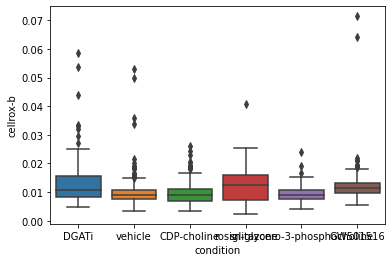

In [41]:
import seaborn as sns
sns.boxplot(data=data, x='condition', y='cellrox-b')


<Axes: xlabel='condition', ylabel='MeanValue'>

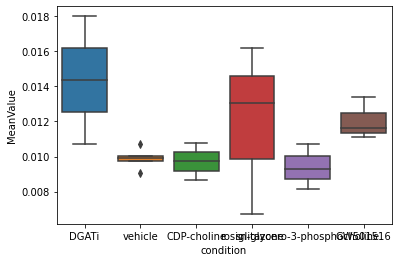

In [45]:
sns.boxplot(data=temp, x='condition', y='MeanValue')
#plt.ylim(-.01,0.2)

In [230]:
ttest_ind(temp['MeanValue'][temp['condition']=='vehicle'], temp['MeanValue'][temp['condition']=='Rosiglitazone'])

Ttest_indResult(statistic=-0.7556209144045165, pvalue=0.47452998784622913)

In [214]:
np.unique(data['condition'])

array(['DGATi', 'GW501516', 'Rosiglitazone', 'choline', 'vehicle'],
      dtype=object)

In [42]:
data['MeanValue'] = data.groupby('filename')['cellrox-b'].transform('mean')


In [44]:
temp = data[['condition', 'MeanValue']].drop_duplicates()
temp

,condition,MeanValue
0,DGATi,0.010725
172,vehicle,0.010698
268,vehicle,0.009901
310,CDP-choline,0.010773
364,CDP-choline,0.009728
436,CDP-choline,0.008637
509,rosiglitazone,0.016187
557,rosiglitazone,0.006721
608,rosiglitazone,0.013047
693,DGATi,0.018013


In [210]:
temp = data[['condition', 'MeanValue']].drop_duplicates()

<Axes: xlabel='condition', ylabel='MeanValue'>

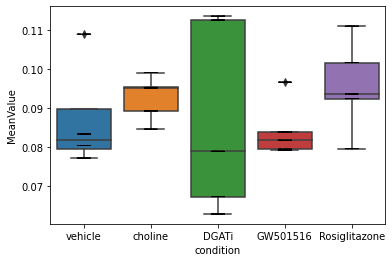

In [211]:
import seaborn as sns
sns.boxplot(data=temp, x='condition', y='MeanValue')
sns.stripplot(x='condition', y='MeanValue', data=data, color='black', size=1, jitter=True)  # Add stripplot


In [193]:
np.unique(data['condition'])

array(['DGATi', 'GW501516', 'Rosiglitazone', 'choline', 'vehicle'],
      dtype=object)

In [206]:
index = (data['condition']=='vehicle') | (data['condition']=='Rosiglitazone')

(0.0, 0.3)

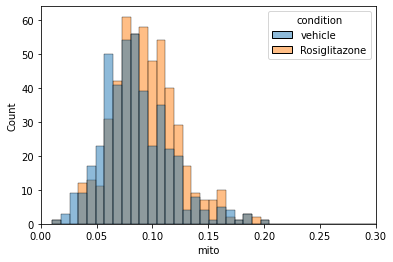

In [207]:
sns.histplot(data = data[index], x='mito', hue = 'condition')
#plt.legend([],[], frameon=False)
plt.xlim(0,0.3)

(0.0, 0.3)

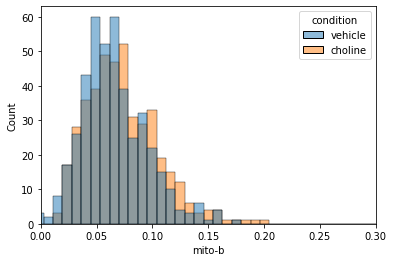

In [198]:
index = (data['condition']=='vehicle') | (data['condition']=='choline')
sns.histplot(data = data[index], x='mito-b', hue = 'condition')
#plt.legend([],[], frameon=False)
plt.xlim(0,0.3)

<Axes: xlabel='condition', ylabel='Cellrox-b'>

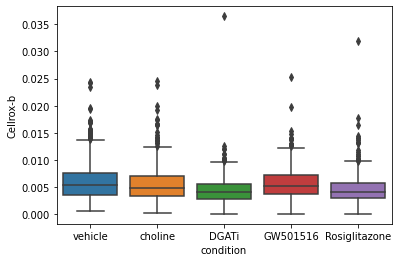

In [141]:
sns.boxplot(data=data, x='condition', y='Cellrox-b')


In [96]:
temp = data[['condition', 'MeanValue']].drop_duplicates()
temp.head()

,condition,MeanValue
0,vehicle,0.008841
100,vehicle,0.005609
210,choline,0.008439
293,choline,0.004236
368,DGATi,0.003515


In [131]:
temp

,condition,MeanValue
0,vehicle,0.008841
100,vehicle,0.005609
210,choline,0.008439
293,choline,0.004236
368,DGATi,0.003515
493,DGATi,0.004226
601,GW501516,0.008665
676,GW501516,0.004923
804,Rosiglitazone,0.006752
875,Rosiglitazone,0.003896


In [146]:
ttest_ind(data['Cellrox-b'][data['condition']=='vehicle'], data['Cellrox-b'][data['condition']=='Rosiglitazone'])

Ttest_indResult(statistic=6.651980505327602, pvalue=5.130185887313845e-11)

In [125]:
from scipy.stats import ttest_ind


<Axes: xlabel='condition', ylabel='MeanValue'>

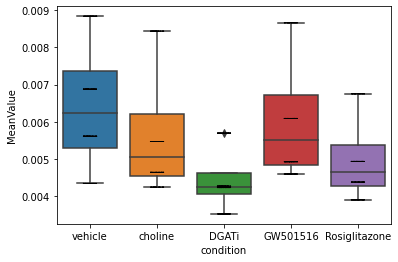

In [100]:
import seaborn as sns
sns.boxplot(data=temp, x='condition', y='MeanValue')
sns.stripplot(x='condition', y='MeanValue', data=data, color='black', size=1, jitter=True)  # Add stripplot


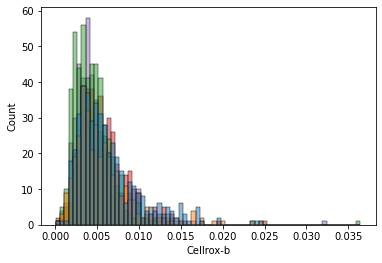

In [76]:
sns.histplot(data = data, x='Cellrox-b', hue = 'condition')
plt.legend([],[], frameon=False)

In [121]:
data['grp'] = ['con' if 'con' in x else 'lof' for x in data['filename']]
data['subject'] = [x.split('_')[0] for x in data['filename']]
data['Ncells'] = [Ncells_per_job[int(x)][0] for x in data['ID']]

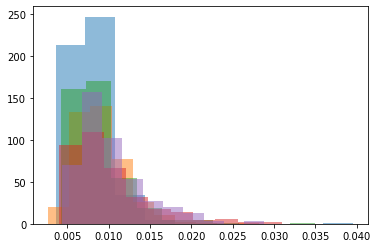

In [68]:
for i in np.unique(data['condition']):
    plt.hist(data[data['condition']==i]['Cellrox'],10, alpha=0.5),
    None

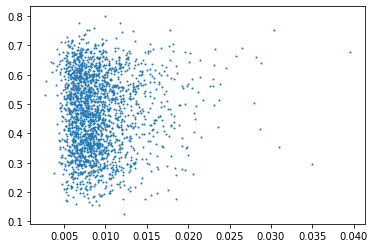

In [50]:
plt.scatter(data['Cellrox'], data['NeuN'], s=1)

In [105]:
import seaborn as sns

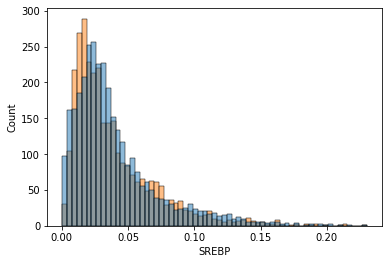

In [127]:
sns.histplot(data = data, x='SREBP', hue = 'grp')
plt.legend([],[], frameon=False)


<Axes: xlabel='grp', ylabel='SREBP-bgrn'>

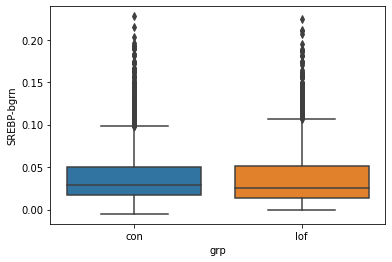

In [144]:
sns.boxplot(data=data[data['NeuN']>0.025], x='grp', y='SREBP-bgrn')

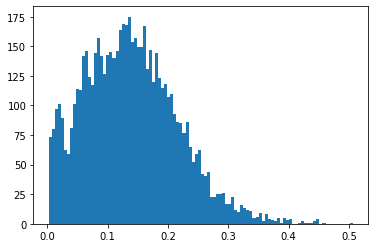

In [140]:
plt.hist(data['NeuN'], 100)
None

In [102]:
data

,SREBP,NeuN,DAPI,SREBP-bgrn,ID,filename,grp
0,0.048602,0.008766,0.556113,0.047172,0.0,10101327con_1.czi,con
1,0.035428,0.089039,0.432103,0.033999,0.0,10101327con_1.czi,con
2,0.053048,0.205970,0.361978,0.051618,0.0,10101327con_1.czi,con
3,0.031155,0.177245,0.322841,0.029725,0.0,10101327con_1.czi,con
4,0.030814,0.010802,0.345600,0.029384,0.0,10101327con_1.czi,con
...,...,...,...,...,...,...,...
6320,0.037428,0.007305,0.483377,0.031930,83.0,84653463lof_6.czi,lof
6321,0.050449,0.010552,0.508793,0.044951,83.0,84653463lof_6.czi,lof
6322,0.058148,0.006946,0.583378,0.052650,83.0,84653463lof_6.czi,lof
6323,0.048955,0.008720,0.686775,0.043457,83.0,84653463lof_6.czi,lof


In [43]:

def reduce_to_3D(out_float, is_4D=True):
    if is_4D:
        axis = (0,1,2)
    else:
        axis = (0,1)
        
    temp = np.max(out_float, axis=axis)
    keep = list(np.where(temp>0)[0])
    zeros = list(np.where(temp==0)[0])

    for i in range(3-len(keep)):
        keep.append(zeros[i])

    if is_4D:
        out_float = out_float[:,:,:,np.sort(keep)]
    else:
        out_float = out_float[:,:,np.sort(keep)]
    return out_float

mat2 = reduce_to_3D(mat_sele, is_4D=True)

IndexError: list index out of range

In [60]:
mat2 = mat_sele.copy()
keep_channel = [1,2]

In [61]:
        channels = range(mat.shape[3])
        channels_discard = np.array(channels)[[x not in set(keep_channel) for x in channels]]
    
        for i in channels_discard:
            mat2[:,:,:,i] = 0

In [69]:
mat_sele1 = extract_channels([1,2], mat_sele)


In [67]:
mat_sele = gamma_correct_image(mat_sele, {0: 1, 1: 1, 2: 1}, {0: 0, 1: 0, 2: 0}, {0: 90, 1: 99.5, 2: 100})


100%|██████████| 31/31 [00:02<00:00, 13.55it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 31/31 [00:02<00:00, 13.49it/s]


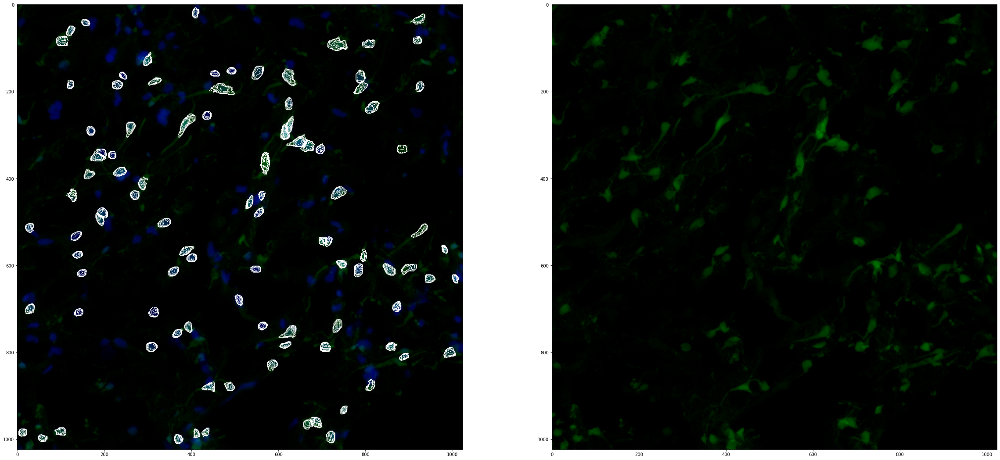

In [2]:
# load outputs
mode = 'r'
folder = './outs/10252023_SREBP2_matchedcohort_out/'
NZi = 3360
xi_per_job = 1024
yi_per_job = 1024
channels = [0, 1, 2]
Njobs = 84
Ncells = 16800

In [5]:
Ncells_per_job

memmap([[ 80],
        [133],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [ 11],
        [  8],
        [  0],
        [  0],
        [ 46],
        [ 25],
        [  0],
        [  0],
        [  0],
        [ 42],
        [  0],
        [ 43],
        [  0],
        [ 50],
        [  0],
        [  0],
        [  0],
        [ 64],
        [  0],
        [  0],
        [  0],
        [ 96],
        [  0],
        [  0],
        [ 63],
        [ 54],
        [  0],
        [  0],
        [  0],
        [ 54],
        [  0],
        [  0],
        [  0],
        [  0],
        [ 45],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [ 

In [76]:
# get indices for specific image
ID = 1
cells_per_job = 200
zi_per_job = 40

start_Y = cells_per_job * ID
end_Y = start_Y + Ncells_per_job[ID][0]

start_zi = zi_per_job * ID
end_zi = start_zi + Nzi_per_job[ID][0]

In [77]:
y = all_Y_filtered[start_Y:end_Y][:,1]

In [78]:
x = all_Y_filtered[start_Y:end_Y][:,3]

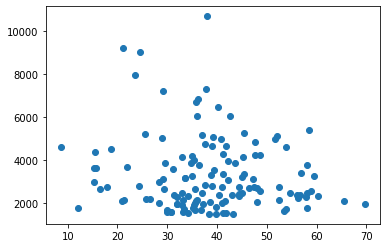

In [79]:
plt.scatter(y,x)

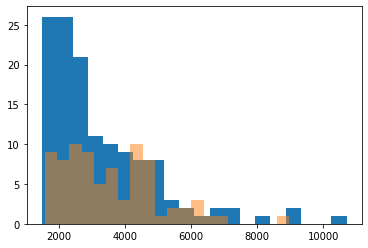

In [57]:
plt.hist(y, 20)
plt.hist(x,20, alpha=0.5)
None


In [30]:
mat2 = extract_channels([1,2], channels, all_mat[start_zi:end_zi])
toggle_segmentation(mat2, all_masks[start_zi:end_zi])

100%|██████████| 27/27 [00:01<00:00, 16.21it/s]


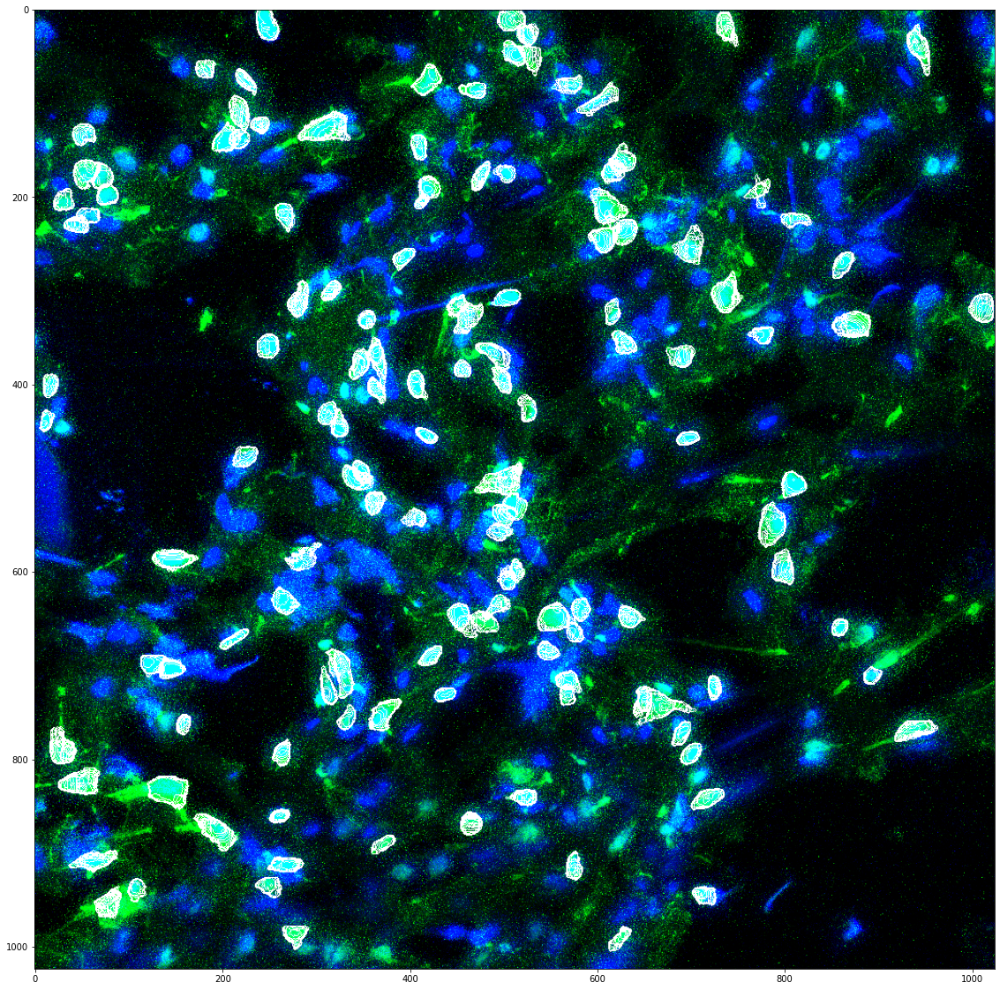

In [29]:
plt.figure(figsize = (20,20))
mat2 = extract_channels([1,2], channels, all_mat[start_zi:end_zi][3:30])

show_maxproj_with_outlines(mat2, all_masks[start_zi:end_zi][3:30])

100%|██████████| 15/15 [00:00<00:00, 16.07it/s]


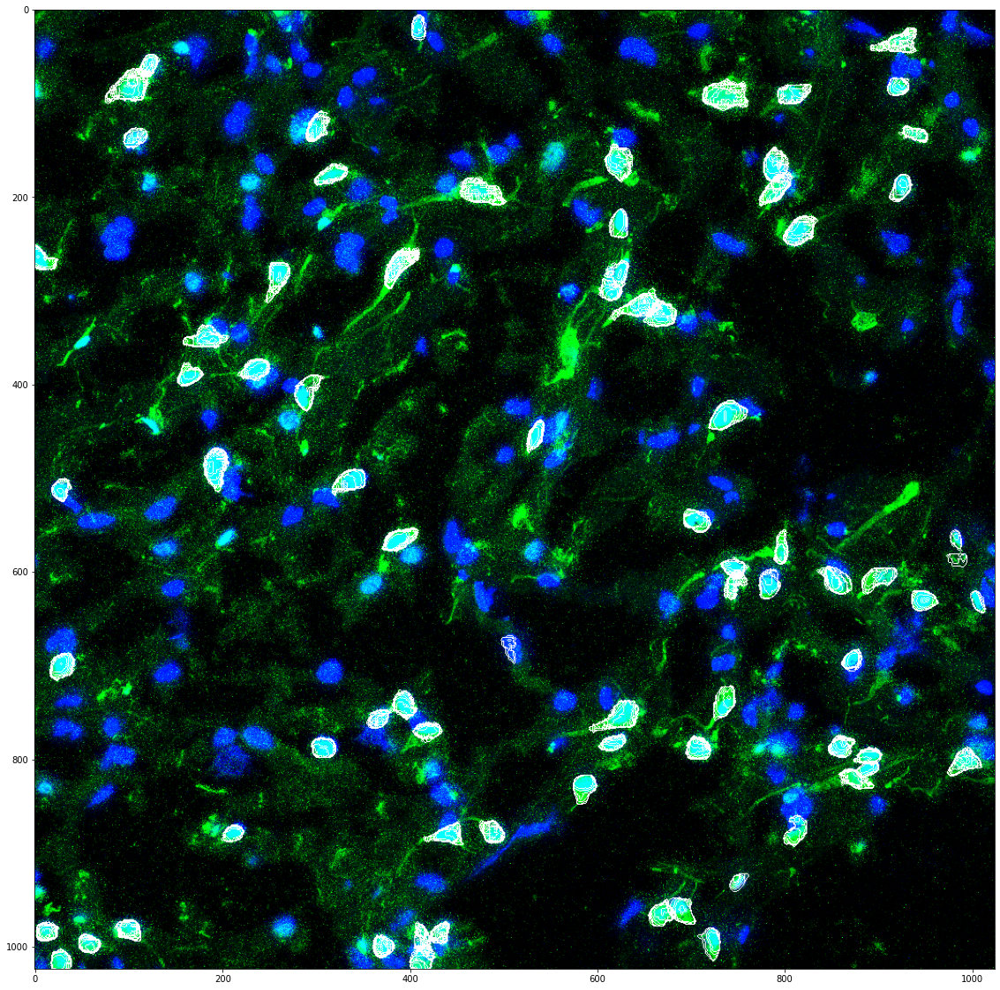

In [17]:
plt.figure(figsize = (20,20))
mat2 = extract_channels([1,2], channels, all_mat[start_zi:end_zi][5:20])

show_maxproj_with_outlines(mat2, all_masks[start_zi:end_zi][5:20])

In [25]:
mat2.shape

(10, 1024, 1024, 4)

100%|██████████| 10/10 [00:00<00:00, 15.86it/s]


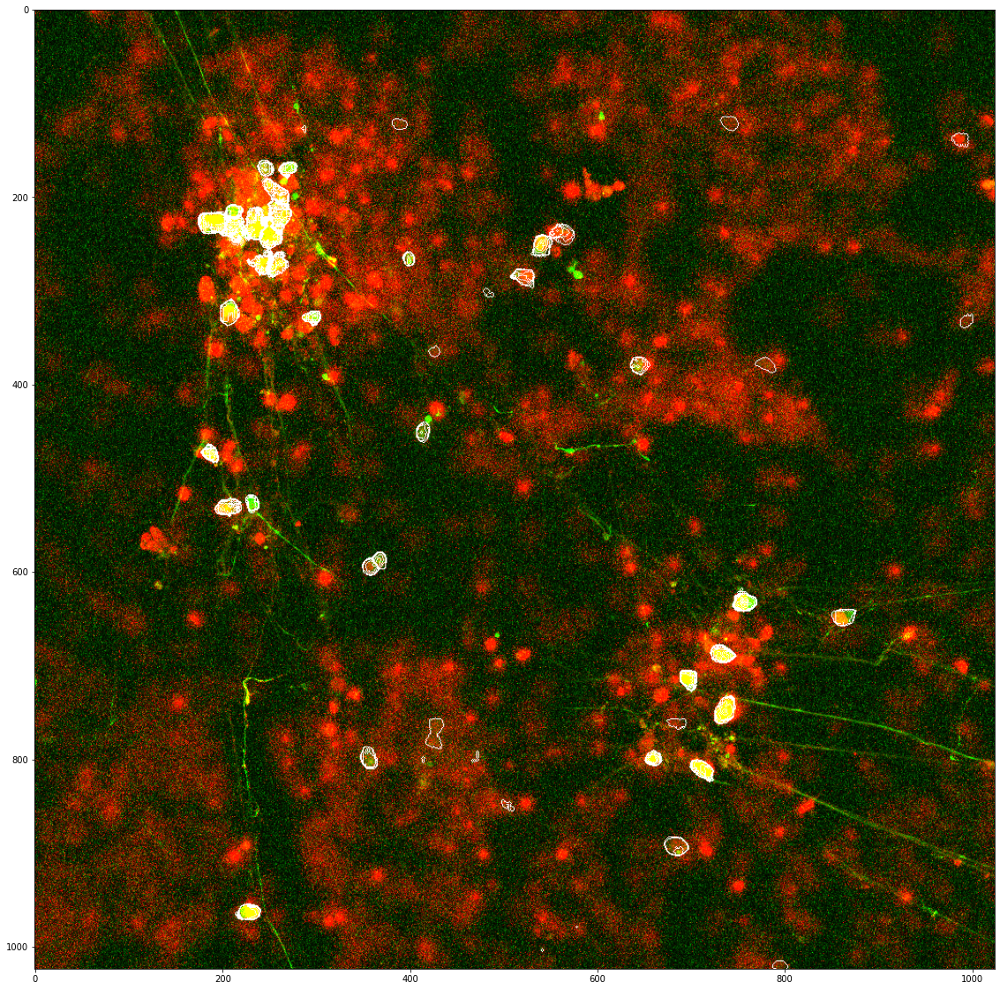

In [26]:
# show projection with filtering
plt.figure(figsize = (20,20))
mat2 = extract_channels([1,0], [0,1,2,3], mat[50:])

show_maxproj_with_outlines(mat2[:,:,:,:3], masks[50:])

In [19]:
mat[50].shape

(1024, 1024, 4)

In [ ]:
mode = 'r+'
all_mat = np.lib.format.open_memmap(path.join(folder, 'mat.npy'), shape=(NZi, xi_per_job, yi_per_job, len(channels)), dtype='uint8', mode=mode)
all_masks = np.lib.format.open_memmap(path.join(folder, 'masks.npy'), shape=(NZi, xi_per_job, yi_per_job), dtype='uint16', mode=mode)
all_Y_filtered = np.lib.format.open_memmap(path.join(folder, 'Y_filtered.npy'), shape=(Ncells, len(channels)+2), dtype=float, mode=mode)
Ncells_per_job = np.lib.format.open_memmap(path.join(folder, 'Ncells_per_job.npy'), shape=(Njobs,1), dtype=int, mode=mode)
